<a href="https://colab.research.google.com/github/PavicicJadranko/Dog-breed-recognizer-using-ML/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classificaton

This notebook bilds an end-to-end multi-class image classifier using TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we are using is from Kaggle's dog breed idetification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation
## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so we use deep learning/transfer learning.
* There are 120 breeds of dog.
* There are around 10k+ images in the train and 10k+ in the test set.

### Get our workspace ready

In [ ]:
# Import necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("Tf Hub version:", hub.__version__)
print("Tf version:", tf.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "note available" )

Tf Hub version: 0.16.1
Tf version: 2.18.0
GPU note available


## Getting our data ready (turning our images into Tensors)

With all machine learning models, our data has to be in numerical format.


In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

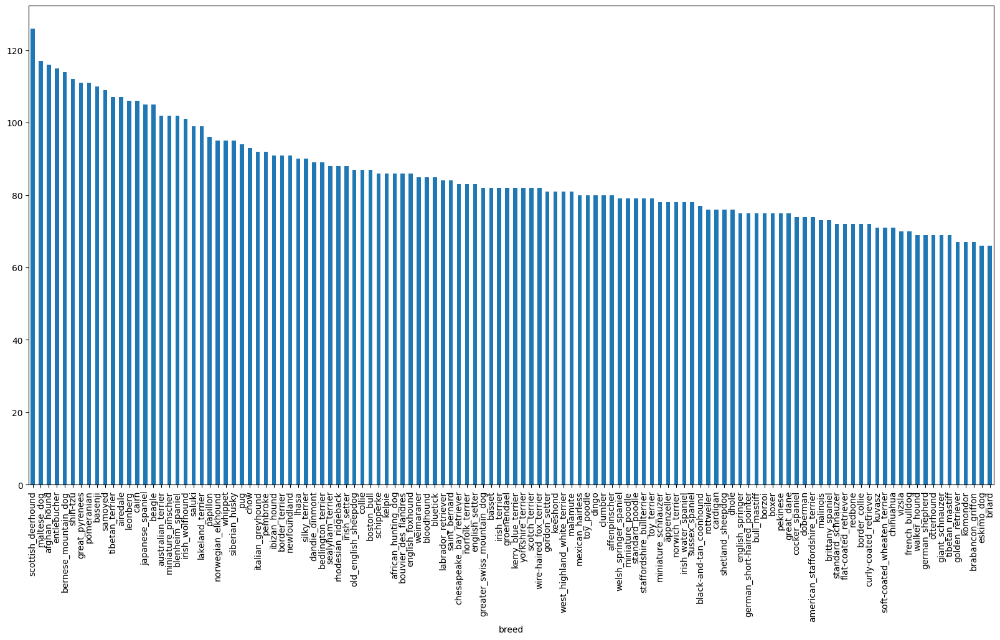

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

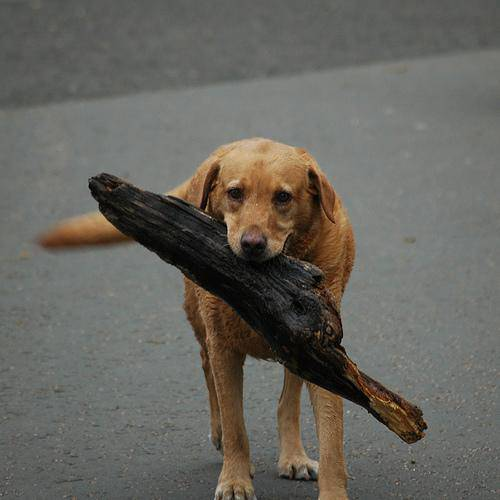

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

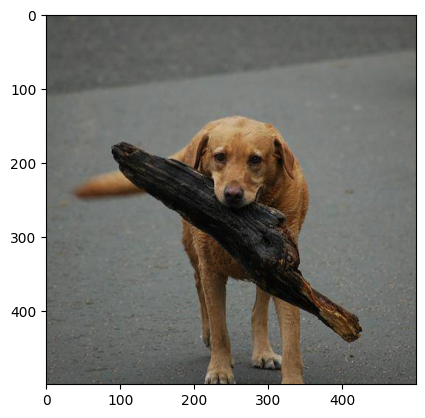

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread("drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")
plt.imshow(img)

### Geting images and labels

Let's get a list of all of our image file pathnames.

In [ ]:
# Create a pathname from image ID's

filename = ["drive/My Drive/Dog Vision/train/"+ fname+ ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filename[:10]


['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:

# Ckeck whether numbers of filenames matches the numbers of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train"))== len(filename):
    print("Number of filenames mathes the number of actual images")
else:
    print("Number of filenames does not match the number of actual images")


Number of filenames mathes the number of actual images


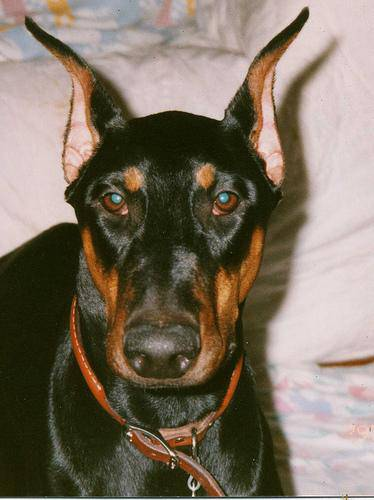

In [ ]:
Image(filename[9001])

Since we've now got our training images filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
len(labels)

10222

In [ ]:
if len(labels) == len(filename):
    print("Number of labels matches the number of filenames")
else:
    print("Number of labels does not match the number of filenames")

Number of labels matches the number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean arry
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning booleans array into integers
integer_labels = [boolean_label.astype(int) for boolean_label in boolean_labels]
integer_labels[:5]

[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
len(integer_labels)

10222

### Create our own validation set

In [ ]:
# Setup X and y
X = filename
y = boolean_labels



We're going to start off experimenting with 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Preprocessing Images into Tensors

To preprocess our images into Tensors we're going to write a function witch does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to variable `image`
3. Turn out `image` into a Tensor
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
# Turn an image into Tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(Image_path, img_size=IMG_SIZE):
    """
    Taken an image file path and turns it into a Tensor of size (224,224)
    """
    # Read in an image file
    image = tf.io.read_file(Image_path)
    # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels=3)
    # Convert the colour channel values from values from 0-255 to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to our desired value(224,224)
    image = tf.image.resize(image, size=[img_size, img_size])

    return image

## Turning our data into batches

Why turn our data into  batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 ( this is the batch size) images at a time (you can manually adjust the batch size if need be).

in order to use TensorFlow effectively, we need our data in the form of Tensor tuples whitch look like this:(`image`,`label`).

In [ ]:
#  Create a simple function to return a tuple of Tensors (image, label)
def get_image_label(image_path, label):
    """
    Takes a image file path name and the assosciated label,
    processes the image and returns a tuple of (image, label)
    """
    image = process_image(image_path)
    return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X&y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of images (X) and label (y) pairs.
    Shuffles the data if it's training data but doesent't shuffle if it's validation data.
    Also accepts test data as input (no labels).

    """
    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print ("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)

        return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
    elif valid_data:
        print("Crating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                 tf.constant(y))) # labels

        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    else:
        print("Creating traning data batches..")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                  tf.constant(y))) # labels

        # Shuffling pathnames and labels before mapping image processor function
        data = data.shuffle(buffer_size=len(X))
        # Create (image, label) tuples (this also turns the images into a preprocessed image)
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
validation_data = create_data_batches(X_val, y_val, valid_data=True)


Creating traning data batches..
Crating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, validation_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, the case can be a little hard to understand, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
    """
    Display a plot of 25 images and their labels from a data batch
    """

    # Setup the figure
    plt.figure(figsize=(10, 10))
    # Let's loop through 25 for displaying 25 images
    for i in range(25):
        # Create subplots(5, 5)
        ax = plt.subplot(5, 5, i+1)
        # Display an image
        plt.imshow(images[i])
        # Add the image labels as the title
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.18509921, 0.17424487, 0.17515522],
          [0.21096714, 0.22035089, 0.2466114 ],
          [0.33764   , 0.3859593 , 0.43396354],
          ...,
          [0.6818185 , 0.6419761 , 0.6032844 ],
          [0.27654317, 0.24124905, 0.2149886 ],
          [0.39017442, 0.3548803 , 0.33527246]],
 
         [[0.16835226, 0.14965478, 0.15207075],
          [0.18725312, 0.1972321 , 0.21505424],
          [0.34657422, 0.3948936 , 0.4428978 ],
          ...,
          [0.49327993, 0.454108  , 0.41881388],
          [0.44815215, 0.4050149 , 0.38325137],
          [0.34934694, 0.30615574, 0.2826263 ]],
 
         [[0.13424487, 0.11657915, 0.11258872],
          [0.15669121, 0.1658544 , 0.18408443],
          [0.25701192, 0.29974064, 0.3479608 ],
          ...,
          [0.4294728 , 0.39417866, 0.36425918],
          [0.5057646 , 0.4572527 , 0.43290746],
          [0.5490389 , 0.49569517, 0.46844664]],
 
         ...,
 
         [[0.54317784, 0.5392563 , 0.51964843],
          [0.57431

In [ ]:
len(train_images), len(train_labels)

(32, 32)

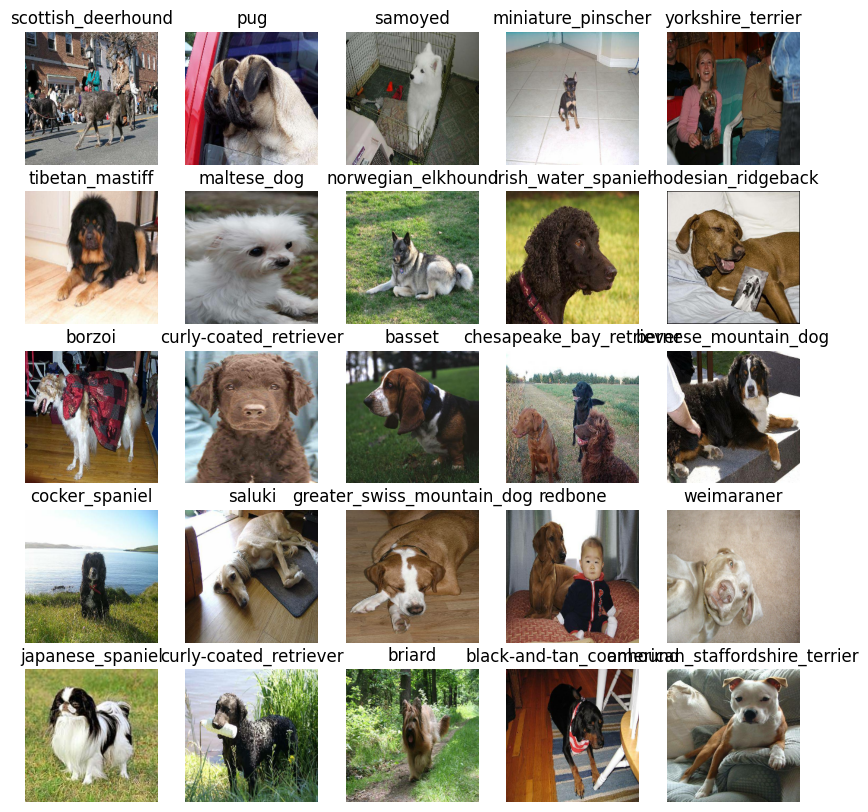

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

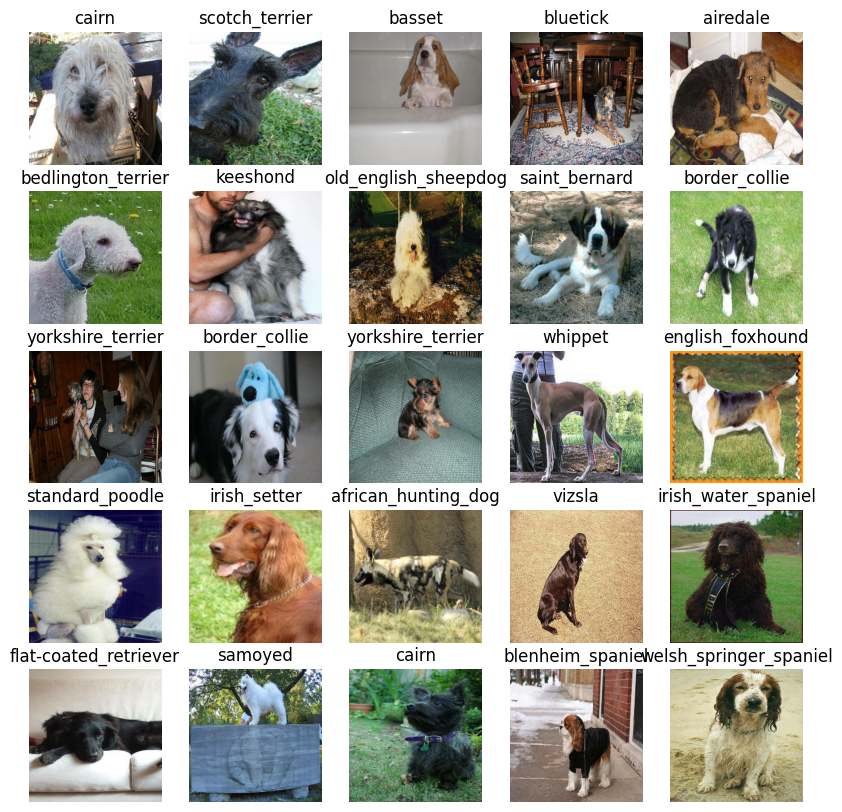

In [ ]:
# Now let's visualiza the validation data batches
val_images, val_labels = next(validation_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are a few thing we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (images labels, in the form of Tensors) of our model.
* The URL of the model we want to use for Tensorflow is from Keggle
https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2?tfhub-redirect=true.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE =[None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now we've got our inputs; outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function witch:
* Takes the input shape; output shape and the model we've chousen as parameters.
* Define the layers in Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it' ll be getting).
* Returns the model.

LL of these steps can be found here:https://www.tensorflow.org/guide/keras/overview

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import keras
from keras import layers
import tf_keras
# Create a function witch builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", MODEL_URL)

    # 1. Create a TensorFlow Hub layer
    hub_layer = hub.KerasLayer(MODEL_URL)

    # 2. Create the Keras sequential model
    model = tf_keras.Sequential([
        hub_layer, # Layer 1 (input layer)
        tf_keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    # Compile the model
    model.compile(
        loss=tf_keras.losses.CategoricalCrossentropy(),
        optimizer=tf_keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)

    return model

NameError: name 'INPUT_SHAPE' is not defined

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

Callbacks are helpers funtions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard whitch helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Ballback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensoreBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a dictionary and pass it to our models `fit()` function.
3. Visualize our models training logs with the %tensorboard magic function(we'll do this after moel training).


In [ ]:
# Load TensoreBord
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to create a TensorBoard callback
def create_tensorboard_callbacks():
    # Create a log directory for storing TensoreBoard logs
    logdir = os.path.join("drive/My Drive/Dog Vision/Logs",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf_keras.callbacks.TensorBoard(logdir)

### Early Stoppying Callback

Early stopping helps stop our model from overfitting by stoping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback

early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100#@param = {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still runing our GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "note available" )

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensoreboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCH`) callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
    """
    Trains a given model and returns the trained version.
    """
    # Create a model
    model = create_model()

    # Create new TensoBoard session everytime we train a model
    tensoreboard = create_tensorboard_callbacks()

    # Fit the model to the data
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=validation_data,
              validation_freq=1,
              callbacks=[tensoreboard, early_stopping])
    return model



In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 195s 8s/step - loss: 4.5480 - accuracy: 0.0938 - val_loss: 3.5415 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 7s 282ms/step - loss: 1.6246 - accuracy: 0.6825 - val_loss: 2.2366 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 5s 207ms/step - loss: 0.5609 - accuracy: 0.9337 - val_loss: 1.7278 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 6s 228ms/step - loss: 0.2542 - accuracy: 0.9862 - val_loss: 1.5085 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 5s 204ms/step - loss: 0.1470 - accuracy: 0.9987 - val_loss: 1.4268 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 6s 233ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.3824 - val_accuracy: 0.6650
Epoch 7/100
25/25 [====================

**Note:** The model is overfitting

### Checking the TensoreBoard logs

The TensoreBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its cintents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/Logs

<IPython.core.display.Javascript object>

## Making and evaluatng predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(validation_data, verbose=1)
predictions

7/7 [==============================] - 2s 117ms/step


array([[2.1437972e-03, 4.6777498e-04, 2.4141744e-03, ..., 1.4900739e-04,
        2.2855251e-05, 3.7374657e-03],
       [8.0911526e-03, 5.3845993e-03, 3.7117817e-03, ..., 3.0871392e-03,
        2.7434512e-03, 2.3301804e-04],
       [7.8116791e-05, 7.4785930e-05, 1.7586086e-04, ..., 6.1065097e-05,
        9.3347975e-05, 7.0126518e-04],
       ...,
       [2.1347438e-05, 4.4059754e-05, 1.1846750e-04, ..., 1.1434270e-04,
        4.0922966e-04, 7.7034696e-05],
       [4.6201758e-03, 5.4573169e-04, 1.1340496e-04, ..., 1.0305413e-04,
        3.3970231e-05, 1.0876423e-02],
       [8.5078855e-04, 1.3864200e-05, 1.1205846e-03, ..., 3.4631973e-03,
        7.0828025e-04, 1.6056602e-04]], dtype=float32)

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value:{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[2.14379723e-03 4.67774982e-04 2.41417438e-03 1.36734132e-04
 4.31300432e-04 8.06677926e-05 7.85591751e-02 3.17958533e-04
 1.63234567e-04 3.90190864e-03 3.27435555e-04 1.85732788e-04
 5.15641063e-04 1.48207022e-04 3.44916945e-04 1.70944328e-03
 4.01244615e-05 1.16717249e-01 1.38183796e-05 2.95977734e-05
 4.60304145e-04 1.27836407e-04 3.46919915e-05 1.67887786e-03
 4.61382442e-05 6.09559123e-04 2.12277129e-01 8.02191571e-05
 1.18440506e-03 6.99194323e-04 5.83828078e-05 2.80151702e-03
 4.43072902e-04 2.16670771e-04 5.91335702e-05 1.22005410e-01
 5.02495568e-05 3.91538459e-04 1.18309952e-04 1.45617640e-04
 1.70209282e-03 1.74897621e-04 4.75081324e-05 1.04066357e-03
 1.72029413e-05 1.83122625e-04 1.36660665e-05 6.13716664e-04
 3.45359149e-04 2.21447510e-04 1.59404954e-04 3.41078558e-05
 4.33056906e-04 1.05121837e-03 2.76665582e-04 7.87694444e-06
 2.32540583e-03 1.09378656e-03 2.85524118e-04 1.63900658e-01
 4.27621329e-04 4.38226343e-05 1.02964649e-03 1.28375314e-05
 4.51582542e-04 2.030218

Having the above functionality is grate but we want to be able to do it at scale.
And it would be even better if we could see the image the prediction is being made on.

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(predicted_probabilities):
    """
    Turns an array of prediction probabilities into a label

    """
    return unique_breeds[np.argmax(predicted_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[8])
pred_label

NameError: name 'predictions' is not defined

In [ ]:
len(predictions)

200

Now since our validation data is still in a batch dataset, we'll have to unbatch it to ake predictions on the validation images and then compare those predictions to the validation labels.

In [ ]:
# Create a functio to unbatch a batch

In [ ]:
def unbatchify(data):
    """
    Takes a batched dataset of (images, labels) and returns separate arrays of images and labels
    """
    images_ = []
    labels_ = []

    for image, label in data.unbatch().as_numpy_iterator():
        images_.append(image)
        labels_.append(unique_breeds[np.argmax(label)])
    return images_, labels_

In [ ]:
# Unbatch the validation data
val_images, val_labels = unbatchify(validation_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get :
* Preiction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Take an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth label and image for sample n
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


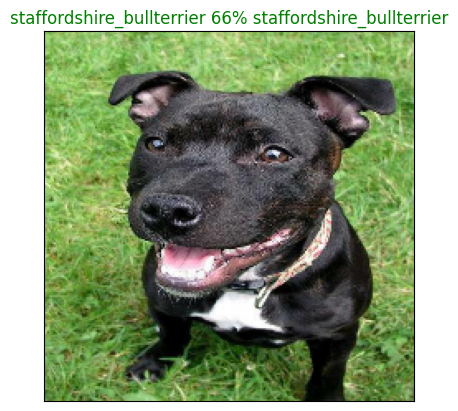

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels= val_labels,
          images= val_images,
          n=50)

Now we've got one function to visualize our models top predictions, let's make another function to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array an integer
* Find the prediction using ´get_pred_label()´
* Find the top 10:
    * Prediction probabilities index
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the truth label green



In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plus the top 10 highest prediction confidences along with the truth labels for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 predicition confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction confidence labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")
    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

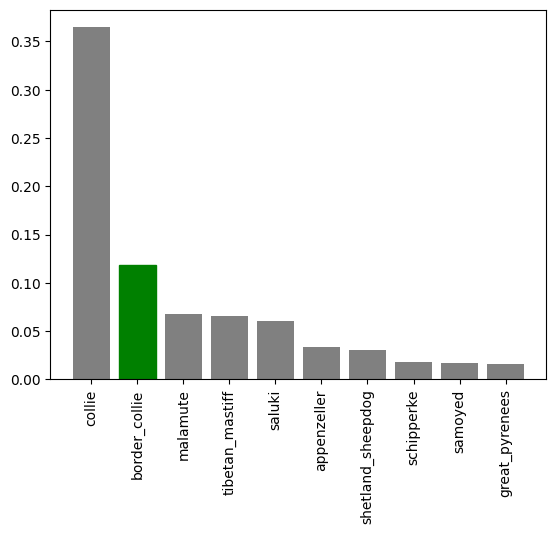

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels= val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out

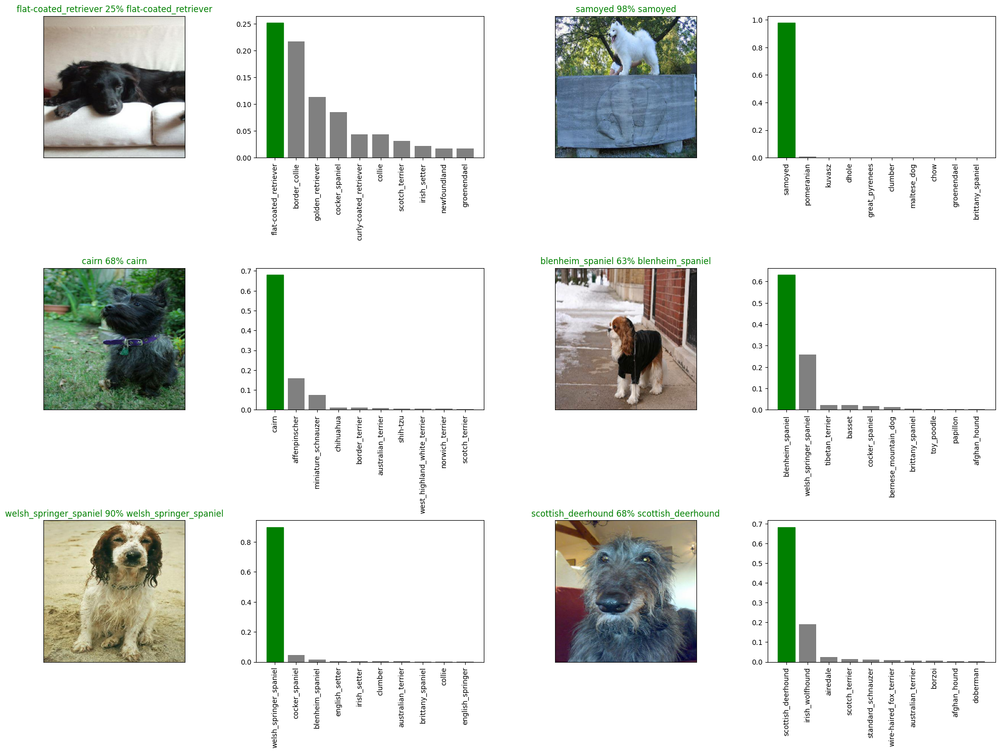

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a traind model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (str).
    """
    # Create a model directory pathname with current time
    modeldir = os.path.join("drive/My Drive/Dog Vision/Models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + "-" + suffix + ".h5"
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [ ]:
# Create a function to load a traind model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading model: {model_path}")
    model = tf_keras.models.load_model(model_path,
                                       custom_objects={"KerasLayer":hub.KerasLayer})
    return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/Models/20250319-11491742384981-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/Models/20250319-11491742384981-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
model = load_model(model_path="/content/drive/MyDrive/Dog Vision/Models/20250317-12421742215369-1000-images-mobilenetv2-Adam.h5")

Loading model: /content/drive/MyDrive/Dog Vision/Models/20250317-12421742215369-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(validation_data)

7/7 [==============================] - 2s 137ms/step - loss: 1.3519 - accuracy: 0.6350


[1.35190749168396, 0.6349999904632568]

## Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating traning data batches..


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Crate a model for full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
# Create full model callbacks
full_model_callbacks_tensorboard = create_tensorboard_callbacks()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Runing the cell below will take a little while!!!

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_callbacks_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 78s 215ms/step - loss: 1.3322 - accuracy: 0.6723
Epoch 2/100
320/320 [==============================] - 61s 191ms/step - loss: 0.4012 - accuracy: 0.8795
Epoch 3/100
320/320 [==============================] - 56s 173ms/step - loss: 0.2372 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 54s 170ms/step - loss: 0.1547 - accuracy: 0.9640
Epoch 5/100
320/320 [==============================] - 54s 168ms/step - loss: 0.1048 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 59s 183ms/step - loss: 0.0780 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 53s 167ms/step - loss: 0.0587 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 179s 559ms/step - loss: 0.0455 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 180s 562ms/step - loss: 0.0379 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 299s 9

In [ ]:
save_model(full_model, suffix="all-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/Models/20250319-12221742386938-all-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/Models/20250319-12221742386938-all-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/My Drive/Dog Vision/Models/20250318-11391742297971-all-images-mobilenetv2-Adam.h5")

Loading model: drive/My Drive/Dog Vision/Models/20250318-11391742297971-all-images-mobilenetv2-Adam.h5


## Making prediction on the train dataset

Since our model has been traind on images in the form of Tensor baches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test images filenames.
* Convert the filenames into test data batches to the `create_data_batches()` and setting the `test_data` parameter to `True`
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test images filenames
test_path = "drive/My Drive/Dog Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/f1167eabf53759dad015f0abb813a451.jpg',
 'drive/My Drive/Dog Vision/test/edd7c1e04601546fc101901d764dc4b4.jpg',
 'drive/My Drive/Dog Vision/test/f01832dc0e1d00e4e5a9286bd88dede2.jpg',
 'drive/My Drive/Dog Vision/test/f453249b8fff37e92e02fce0d662ffa0.jpg',
 'drive/My Drive/Dog Vision/test/e91b757847fad1809a9ffa8c15f5504f.jpg',
 'drive/My Drive/Dog Vision/test/ef8f1d898040c1fe2972ebe945184056.jpg',
 'drive/My Drive/Dog Vision/test/ede76874678b483c87bfe1db25f78f9b.jpg',
 'drive/My Drive/Dog Vision/test/e967dd3dc67352cc2525c8283bf2751d.jpg',
 'drive/My Drive/Dog Vision/test/f27e014627c0495cd7a9ef27235bc7a6.jpg',
 'drive/My Drive/Dog Vision/test/e85b19a69be67eaef9fe58b7e689ee81.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch sing the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 40s 123ms/step


In [ ]:
import numpy as np
# Save predictions to csv file
np.savetxt("drive/My Drive/Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

In [ ]:

import numpy as np
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/test_predictions.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.61013302e-12, 9.15982980e-07, 9.69581221e-11, ...,
        3.83257088e-08, 5.02703955e-12, 1.53497386e-13],
       [1.85643330e-13, 1.00617881e-09, 1.09754897e-13, ...,
        4.07902512e-09, 5.63966972e-12, 2.45183973e-12],
       [1.35497501e-07, 2.20567972e-06, 1.11059616e-11, ...,
        1.60496887e-12, 1.86340415e-10, 3.12582127e-10],
       ...,
       [1.03101860e-09, 1.55098337e-10, 5.15950442e-11, ...,
        2.40123987e-09, 1.54642150e-11, 7.52001217e-09],
       [1.31748196e-10, 5.69461989e-08, 1.37370426e-09, ...,
        8.76942075e-09, 3.45311024e-09, 1.79173061e-12],
       [5.18941370e-08, 2.49380446e-05, 4.25769571e-07, ...,
        3.09261772e-08, 2.68012104e-06, 4.91959229e-02]])

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
import os
pred_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
pred_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
test_ids = [path[0] for path in test_ids]
pred_df["id"] = test_ids
pred_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f1167eabf53759dad015f0abb813a451,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,edd7c1e04601546fc101901d764dc4b4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f01832dc0e1d00e4e5a9286bd88dede2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f453249b8fff37e92e02fce0d662ffa0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e91b757847fad1809a9ffa8c15f5504f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0763ebab76bfd9cbfaac696cc604d35e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,08680f416f6cf8ab00fcdf51c217b5f7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,0854e34e53c9dd84579d4c37086dbdf5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,07e62ee044a6b7d6a45e92c65ff44f4e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pred_df[list(unique_breeds)] = test_predictions
pred_df = pred_df.reset_index(drop=True)
pred_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f1167eabf53759dad015f0abb813a451,4.610133e-12,9.159830e-07,9.695812e-11,1.783998e-08,5.906662e-11,3.742589e-07,2.090238e-11,3.557453e-11,2.441877e-11,...,1.057705e-10,1.936509e-14,1.587626e-12,3.073796e-07,1.838436e-11,3.908351e-10,6.579839e-11,3.832571e-08,5.027040e-12,1.534974e-13
1,edd7c1e04601546fc101901d764dc4b4,1.856433e-13,1.006179e-09,1.097549e-13,1.740237e-12,3.927389e-08,9.802741e-10,7.658668e-13,5.216113e-11,1.230762e-15,...,1.103619e-11,5.028835e-15,9.635538e-13,1.033023e-08,9.448296e-11,3.034349e-11,1.982577e-10,4.079025e-09,5.639670e-12,2.451840e-12
2,f01832dc0e1d00e4e5a9286bd88dede2,1.354975e-07,2.205680e-06,1.110596e-11,3.327102e-10,1.258164e-09,8.532071e-10,5.966252e-13,1.636723e-09,1.743841e-10,...,2.091261e-06,4.926053e-11,1.815017e-10,3.451900e-10,8.163249e-11,1.341934e-11,2.148993e-12,1.604969e-12,1.863404e-10,3.125821e-10
3,f453249b8fff37e92e02fce0d662ffa0,2.719639e-11,2.957522e-15,2.296277e-10,1.641609e-12,1.412063e-11,1.921890e-13,2.077114e-11,1.145951e-08,1.084828e-12,...,5.770575e-13,1.086468e-09,7.414876e-14,1.912035e-11,2.267934e-12,2.357850e-13,1.027063e-12,4.622998e-11,5.530005e-12,1.799793e-13
4,e91b757847fad1809a9ffa8c15f5504f,1.806030e-11,3.851920e-14,1.637539e-11,7.256886e-14,5.323669e-11,2.336168e-12,2.915479e-10,9.733383e-08,4.673181e-13,...,2.766317e-11,1.423889e-10,2.863670e-12,2.438994e-12,1.458321e-12,5.763954e-13,4.938126e-12,1.615478e-12,8.045214e-10,1.903712e-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0763ebab76bfd9cbfaac696cc604d35e,5.635733e-10,2.124073e-06,4.081481e-12,1.346074e-08,1.327331e-10,4.644950e-11,9.254618e-12,2.398449e-09,4.522729e-08,...,8.191132e-05,3.020331e-11,2.462812e-10,3.738917e-09,7.934847e-09,7.004415e-09,2.796739e-08,5.519238e-10,3.062410e-08,1.620744e-12
10353,08680f416f6cf8ab00fcdf51c217b5f7,3.296859e-09,5.077961e-04,5.895683e-07,2.446616e-10,1.557879e-06,6.891839e-05,5.380065e-10,5.069012e-09,3.415527e-10,...,1.163604e-11,9.262597e-07,1.718632e-12,1.982210e-03,9.254928e-06,8.719175e-14,3.914321e-07,6.554655e-05,1.148111e-05,1.314351e-11
10354,0854e34e53c9dd84579d4c37086dbdf5,5.965093e-11,1.229307e-12,1.223709e-12,1.858381e-10,1.044092e-11,8.110704e-12,5.264206e-11,1.680732e-11,7.651829e-14,...,6.453978e-10,1.174795e-09,2.427194e-11,1.950568e-12,1.445559e-14,2.645980e-14,3.300781e-13,7.245015e-08,5.230844e-12,4.194680e-10
10355,07e62ee044a6b7d6a45e92c65ff44f4e,5.847573e-13,2.021809e-12,2.655828e-09,1.307288e-10,6.694339e-08,1.076096e-11,5.099578e-12,1.191882e-11,5.422848e-10,...,1.563242e-08,2.831859e-12,2.626078e-04,1.609647e-08,9.994796e-01,6.970895e-12,4.764762e-10,2.471609e-11,9.439390e-13,1.278146e-07


In [ ]:
search_id = "ea5ae600ca3996528b6548eceac767cf"
result = pred_df[pred_df['id'] == search_id]
result

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
11,ea5ae600ca3996528b6548eceac767cf,0.999833,1.767066e-10,1.755559e-11,6.438126e-10,4.073636e-12,1.481200e-13,2.125925e-11,3.857136e-12,2.436824e-13,...,1.467880e-07,1.809033e-10,5.711441e-10,2.117163e-08,4.525610e-13,1.189308e-14,9.069802e-13,1.418442e-11,6.587199e-09,3.528201e-09


In [ ]:
# Save our predictions to CSV for submission to Kaggle
pred_df.to_csv("drive/My Drive/Dog Vision/full_test_predictions.csv", index=False)


In [ ]:
## Making predictions on custome images
import os
custom_path = "drive/My Drive/Dog Vision/MyDogImages"
custome_img_paths = [custom_path + "/" + fname for fname in os.listdir(custom_path)]
custome_img_paths

['drive/My Drive/Dog Vision/MyDogImages/malamut.jpg',
 'drive/My Drive/Dog Vision/MyDogImages/huski.jpg',
 'drive/My Drive/Dog Vision/MyDogImages/labrador.jpg']

In [ ]:
# Turn custom images into batch datasets
custome_data = create_data_batches(custome_img_paths, test_data=True)

Creating test data batches...


In [ ]:
custome_data


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custome_preds = loaded_full_model.predict(custome_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custome_preds.shape


(3, 120)

In [ ]:
# get custome image prediction labels
custome_preds_labels = [get_pred_label(custome_preds[i]) for i in range(len(custome_preds))]
custome_preds_labels

['siberian_husky', 'siberian_husky', 'american_staffordshire_terrier']

In [ ]:
custome_images = []
for images in custome_data.unbatch().as_numpy_iterator():
    custome_images.append(images)


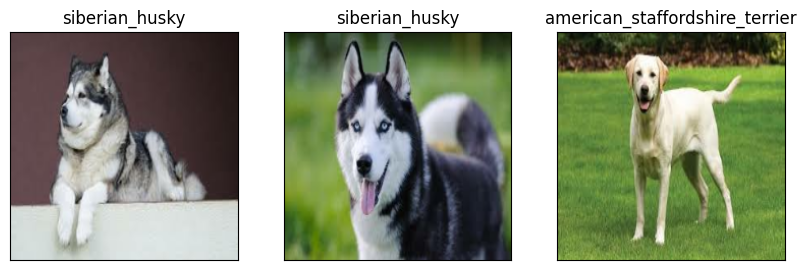

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i, image in enumerate(custome_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custome_preds_labels[i])
    plt.imshow(image)
plt.show()